In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import drive
import plotly.express as px


In [ ]:
# Cargar el dataset
file_path = "/content/drive/MyDrive/Analisis matemático/TABLAFINAL_LARGA FINAL FINAL FINAL Resumida.csv"  # Ajusta la ruta si es necesario
df = pd.read_csv(file_path)
file_path2="/content/drive/MyDrive/ASE/TABLAFINALCONLAQUEPUEDOHACERCOSAS.csv"
df2 = pd.read_csv(file_path2, encoding='latin-1')
file_path3="/content/drive/MyDrive/Analisis matemático/CONLAQUEPUEDOHACERCOSAS4 CSV.csv"
df3 = pd.read_csv(file_path3, encoding='latin-1')
file_path4="/content/drive/MyDrive/Analisis matemático/Final con PIB arreglado csv.csv"
df4 = pd.read_csv(file_path4,encoding='latin-1')
file_path5="/content/drive/MyDrive/Analisis matemático/FINAL 2027 CSV.csv"
df5 = pd.read_csv(file_path5, encoding='latin-1')
file_path6="/content/drive/MyDrive/Analisis matemático/FINALMODELOajustelocal.csv"
df6 = pd.read_csv(file_path5, encoding='latin-1')




In [ ]:
display(df4)

,COUNTRY_CODE,COUNTRY,Year,POBLACION_0_14,POBLACION_TOTAL,PIB_POR_PAIS,TASA_MORTALIDAD_INFANTIL,POBLACION_20_24_VARONES,POBLACION_20_24_MUJERES,MEDALLAS_TOTALES,MEDALLAS_DE_ORO,Country Name
0,AFG,Afghanistan,1960,3789907,9035043.0,NaN,NaN,8.97,8.80,0,0,Afganistán
1,AFG,Afghanistan,1964,4162207,9814318.0,NaN,223.9,8.84,8.71,0,0,Afganistán
2,AFG,Afghanistan,1968,4671648,10756922.0,NaN,209.3,8.79,9.07,0,0,Afganistán
3,AFG,Afghanistan,1972,5261617,11853696.0,NaN,194.8,8.34,8.68,0,0,Afganistán
4,AFG,Afghanistan,1976,5909060,13059851.0,NaN,180.0,8.31,8.40,0,0,Afganistán
...,...,...,...,...,...,...,...,...,...,...,...,...
3514,ZWE,Zimbabwe,2008,5489264,12959149.0,340.740183,55.6,11.11,11.66,4,1,Zimbabwe
3515,ZWE,Zimbabwe,2012,6035612,13817887.0,1238.601090,46.8,9.05,9.34,0,0,Zimbabwe
3516,ZWE,Zimbabwe,2016,6365033,14600294.0,1407.415364,40.4,7.89,8.19,0,0,Zimbabwe
3517,ZWE,Zimbabwe,2020,6549831,15526888.0,1730.413489,36.4,8.56,8.52,0,0,Zimbabwe


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


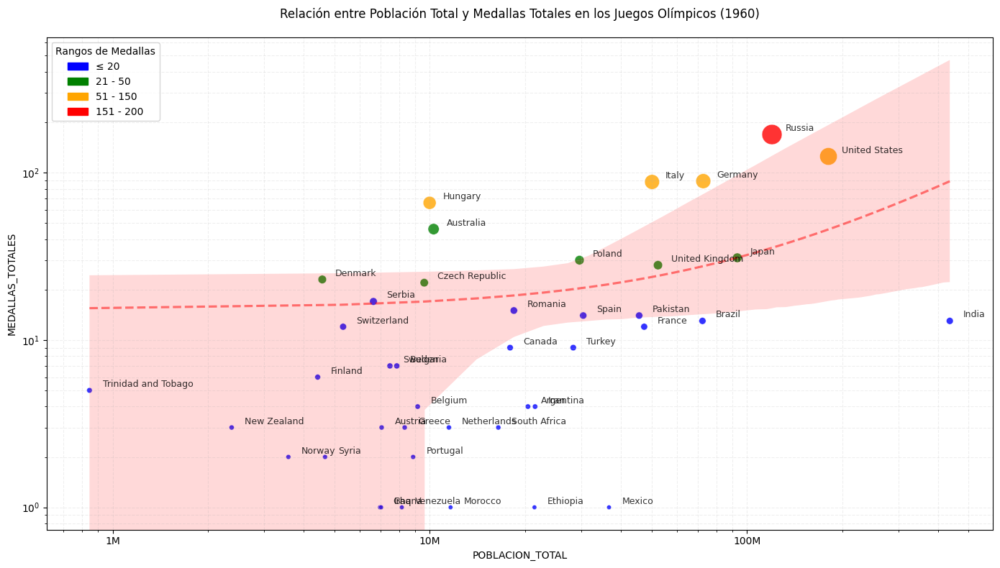

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# Filtrar por año 1960 y países con medallas
df_1960 = df4[df4["Year"] == 1960]
df_filtrado = df_1960[(df_1960["MEDALLAS_TOTALES"] > 0) & (df_1960["MEDALLAS_TOTALES"] < 250)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.figure(figsize=(14, 8))

# 1. Define color thresholds and corresponding colors
thresholds = [20, 50, 150, 200]  # Medal count thresholds
colors = ['blue', 'green', 'orange', 'red']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado['color_index'] = df_filtrado['MEDALLAS_TOTALES'].apply(map_medal_to_color)

# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    size="MEDALLAS_TOTALES",
    sizes=(20, 400),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas', loc='upper left')

#
# Escala logarítmica para ambos ejes
plt.xscale('log')
plt.yscale('log')

# Ajustar ticks del eje x para mejor legibilidad
plt.xticks([1e6, 1e7, 1e8, 1e9], ['1M', '10M', '100M', '1B'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado)):
    plt.text(
        df_filtrado.iloc[i]["POBLACION_TOTAL"] * 1.1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado.iloc[i]["MEDALLAS_TOTALES"] * 1.05,
        df_filtrado.iloc[i]["COUNTRY"],
        fontsize=9,
        alpha=0.8
    )

# Títulos y etiquetas mejoradas
plt.title("Relación entre Población Total y Medallas Totales en los Juegos Olímpicos (1960)", pad=20)
plt.xlabel("Población Total (escala logarítmica)")
plt.ylabel("Medallas Totales (escala logarítmica)")

# Leyenda mejorada
#plt.legend(title='Medallas', bbox_to_anchor=(1.05, 1), loc='upper left')

# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    scatter=False,
    color='red',
    line_kws={'linestyle': '--', 'alpha': 0.5}
)

# Ajustar márgenes
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

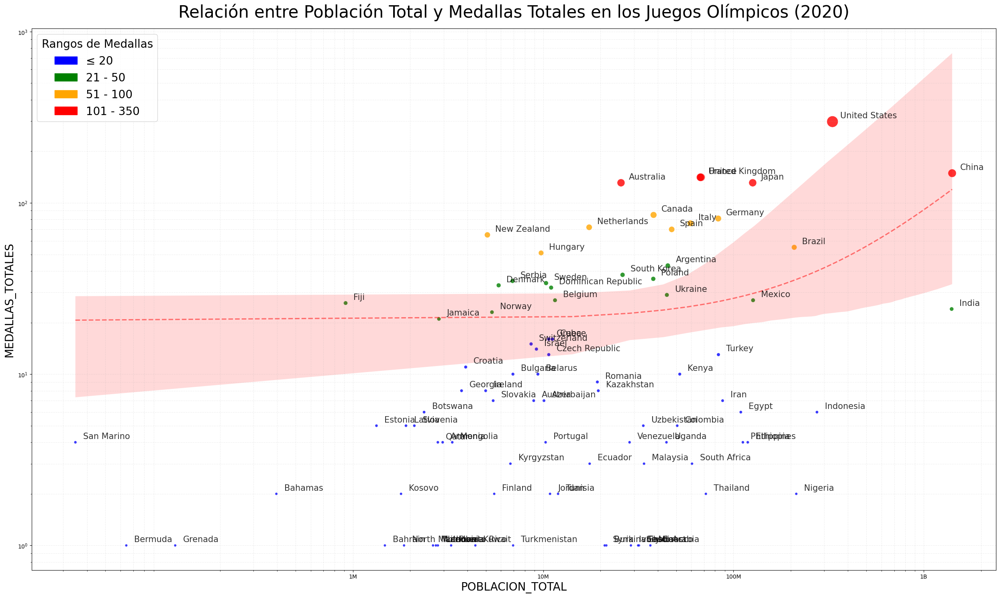

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# Filtrar por año 2020 y países con medallas
df_2020 = df[df["ANOO"] == 2020]
df_filtrado = df_2020[(df_2020["MEDALLAS_TOTALES"] > 0) & (df_2020["MEDALLAS_TOTALES"] < 400)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.figure(figsize=(25, 15))

# 1. Define color thresholds and corresponding colors
thresholds = [20, 50, 100, 350]  # Medal count thresholds
colors = ['blue', 'green', 'orange', 'red']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado['color_index'] = df_filtrado['MEDALLAS_TOTALES'].apply(map_medal_to_color)


# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    size="MEDALLAS_TOTALES",
    sizes=(20, 400),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas', loc='upper left',title_fontsize=20,prop={'size': 20})

#
# Escala logarítmica para ambos ejes
plt.xscale('log')
plt.yscale('log')

# Ajustar ticks del eje x para mejor legibilidad
plt.xticks([1e6, 1e7, 1e8, 1e9], ['1M', '10M', '100M', '1B'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado)):
    plt.text(
        df_filtrado.iloc[i]["POBLACION_TOTAL"] * 1.1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado.iloc[i]["MEDALLAS_TOTALES"] * 1.05,
        df_filtrado.iloc[i]["COUNTRY"],
        fontsize=15,
        alpha=0.8
    )

# Títulos y etiquetas mejoradas
plt.title("Relación entre Población Total y Medallas Totales en los Juegos Olímpicos (2020)",fontsize=30, pad=20)
plt.xlabel("Población Total (escala logarítmica)",fontsize=20)
plt.ylabel("Medallas Totales (escala logarítmica)",fontsize=20)

# Leyenda mejorada
#plt.legend(title='Medallas', bbox_to_anchor=(1.05, 1), loc='upper left')

# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    scatter=False,
    color='red',
    line_kws={'linestyle': '--', 'alpha': 0.5}
)

# Ajustar márgenes
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

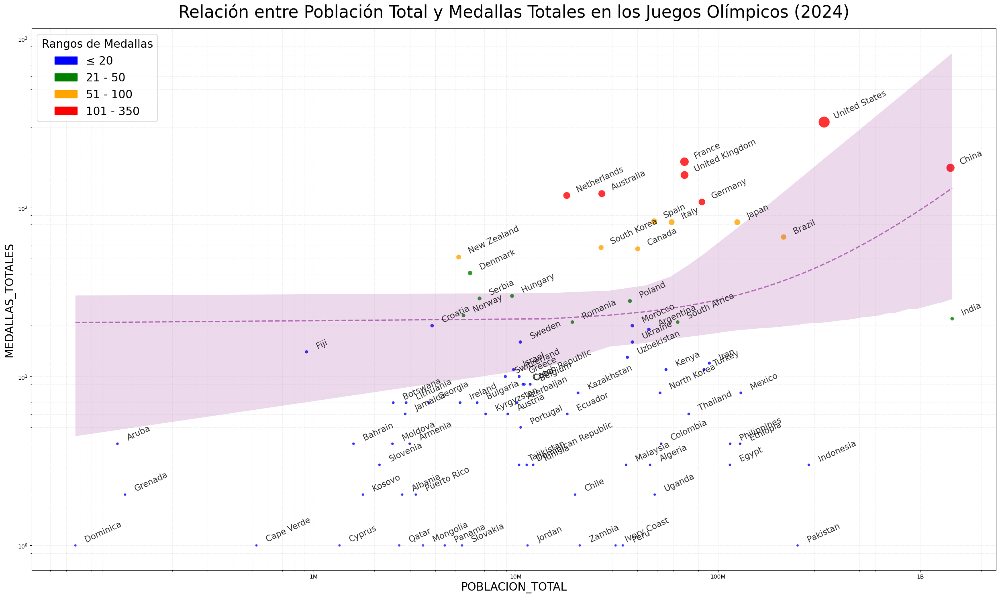

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# Filtrar por año 2020 y países con medallas
df_2020 = df[df["ANOO"] == 2024]
df_filtrado = df_2020[(df_2020["MEDALLAS_TOTALES"] > 0) & (df_2020["MEDALLAS_TOTALES"] < 400)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.figure(figsize=(25, 15))

# 1. Define color thresholds and corresponding colors
thresholds = [20, 50, 100, 350]  # Medal count thresholds
colors = ['blue', 'green', 'orange', 'red']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado['color_index'] = df_filtrado['MEDALLAS_TOTALES'].apply(map_medal_to_color)


# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    size="MEDALLAS_TOTALES",
    sizes=(20, 400),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas', loc='upper left',title_fontsize=20,prop={'size': 20})

#
# Escala logarítmica para ambos ejes
plt.xscale('log')
plt.yscale('log')

# Ajustar ticks del eje x para mejor legibilidad
plt.xticks([1e6, 1e7, 1e8, 1e9], ['1M', '10M', '100M', '1B'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado)):
    plt.text(
        df_filtrado.iloc[i]["POBLACION_TOTAL"] * 1.1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado.iloc[i]["MEDALLAS_TOTALES"] * 1.05,
        df_filtrado.iloc[i]["COUNTRY"],
        fontsize=15,
        alpha=0.8,
        rotation=25

    )

# Títulos y etiquetas mejoradas
plt.title("Relación entre Población Total y Medallas Totales en los Juegos Olímpicos (2024)",fontsize=30, pad=20)
plt.xlabel("Población Total (escala logarítmica)",fontsize=20)
plt.ylabel("Medallas Totales (escala logarítmica)",fontsize=20)

# Leyenda mejorada
#plt.legend(title='Medallas', bbox_to_anchor=(1.05, 1), loc='upper left')

# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado,
    x="POBLACION_TOTAL",
    y="MEDALLAS_TOTALES",
    scatter=False,
    color='purple',
    line_kws={'linestyle': '--', 'alpha': 0.5}
)

# Ajustar márgenes
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

In [ ]:
df_filtrado

,COUNTRY,ANOO,POBLACION_0_14,POBLACION_TOTAL,PIB_POR_PAIS,TASA_MORTALIDAD_INFANTIL,POBLACION_20_24_VARONES,POBLACION_20_24_MUJERES,MEDALLAS_TOTALES,MEDALLAS_DE_ORO,color_index
117,Argentina,2020,10710085.0,45191965.0,602094.07,8.9,7.95,7.50,43.0,0.0,1
134,Armenia,2020,597310.0,2961500.0,2087422.79,10.1,6.52,5.51,4.0,0.0,0
168,Australia,2020,4760426.0,25649248.0,77260.08,3.2,6.88,6.39,131.0,36.0,3
185,Austria,2020,1283418.0,8916864.0,42651.53,2.8,6.00,5.49,7.0,1.0,0
202,Azerbaijan,2020,2360777.0,10093121.0,7190.85,17.6,7.15,6.88,7.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...
3330,Ukraine,2020,6828625.0,44680014.0,100006.20,7.1,5.18,4.31,29.0,1.0,1
3364,United Kingdom,2020,12052033.0,67081234.0,31357.29,3.7,6.49,5.91,141.0,41.0,3
3381,United States,2020,60977275.0,331526933.0,64411.37,5.5,6.75,6.36,298.0,113.0,3
3415,Uzbekistan,2020,9987131.0,33586372.0,19890149.33,13.2,8.28,8.02,5.0,3.0,0


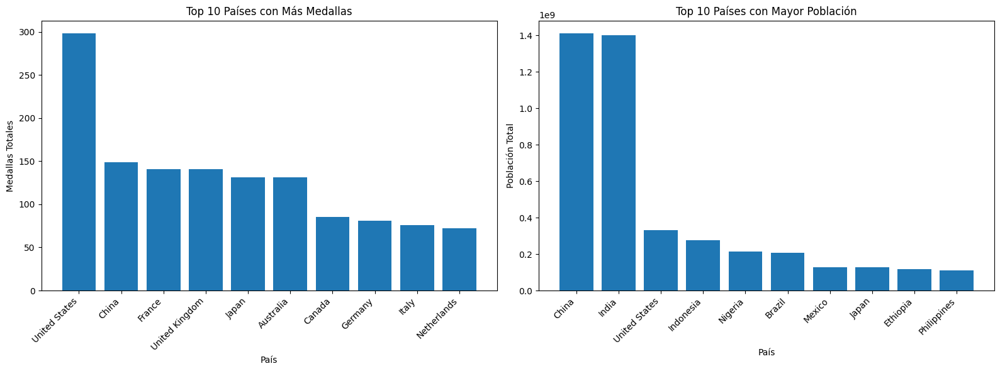

In [ ]:
# prompt: Using dataframe df_filtrado: Gráfico de barras con los 10 paises con mas medallas y los 10 con mayor población

import pandas as pd
import matplotlib.pyplot as plt

# Sort the dataframe by total medals in descending order and get the top 10
top_10_medals = df_filtrado.sort_values(by='MEDALLAS_TOTALES', ascending=False).head(10)

# Sort the dataframe by total population in descending order and get the top 10
top_10_population = df_filtrado.sort_values(by='POBLACION_TOTAL', ascending=False).head(10)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # Adjust figsize as needed

# Plot top 10 countries by medals
axes[0].bar(top_10_medals['COUNTRY'], top_10_medals['MEDALLAS_TOTALES'])
axes[0].set_title('Top 10 Países con Más Medallas')
axes[0].set_xlabel('País')
axes[0].set_ylabel('Medallas Totales')
# Rotate x-axis labels for better readability, use the 'rotation' and 'horizontalalignment' keywords instead of 'rotation' and 'ha'
plt.setp(axes[0].get_xticklabels(), rotation=45, horizontalalignment='right')

# Plot top 10 countries by population
axes[1].bar(top_10_population['COUNTRY'], top_10_population['POBLACION_TOTAL'])
axes[1].set_title('Top 10 Países con Mayor Población')
axes[1].set_xlabel('País')
axes[1].set_ylabel('Población Total')
# Rotate x-axis labels for better readability, use the 'rotation' and 'horizontalalignment' keywords instead of 'rotation' and 'ha'
plt.setp(axes[1].get_xticklabels(), rotation=45, horizontalalignment='right')

plt.tight_layout() # Adjust spacing between subplots
plt.show()


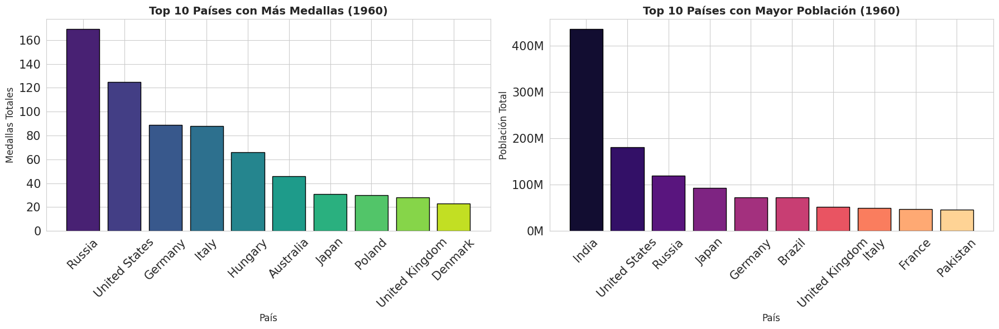

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import drive

# Cargar el dataset
file_path = "/content/drive/MyDrive/ASE/ASE2/TABLAFINAL_LARGA FINAL FINAL FINAL Resumida.csv"  # Ajusta la ruta si es necesario
df = pd.read_csv(file_path)

# ... (other code for the scatter plot, if needed) ...

# --- Bar Charts ---
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Import Seaborn for styling

# Filter data for 1960 and countries with medals
df_1960 = df[df["ANOO"] == 1960]
df_filtrado = df_1960[(df_1960["MEDALLAS_TOTALES"] > 0) & (df_1960["MEDALLAS_TOTALES"] < 250)].copy()

# Sort the dataframe by total medals in descending order and get the top 10
top_10_medals = df_filtrado.sort_values(by='MEDALLAS_TOTALES', ascending=False).head(10)

# Sort the dataframe by total population in descending order and get the top 10
top_10_population = df_filtrado.sort_values(by='POBLACION_TOTAL', ascending=False).head(10)

# Set Seaborn style
sns.set_style("whitegrid")

# Create subplots with improved figsize
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

palette = sns.color_palette("viridis", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors

# --- Enhancements for Medals Bar Chart ---
axes[0].bar(top_10_medals['COUNTRY'], top_10_medals['MEDALLAS_TOTALES'], color=palette, edgecolor='black')
axes[0].set_title('Top 10 Países con Más Medallas (1960)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('País', fontsize=12)
axes[0].set_ylabel('Medallas Totales', fontsize=12)
axes[0].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[0].tick_params(axis='y', labelsize=15)

palette2 = sns.color_palette("magma", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors
# --- Enhancements for Population Bar Chart ---
axes[1].bar(top_10_population['COUNTRY'], top_10_population['POBLACION_TOTAL'], color=palette2, edgecolor='black')
axes[1].set_title('Top 10 Países con Mayor Población (1960)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('País', fontsize=12)
axes[1].set_ylabel('Población Total', fontsize=12)
axes[1].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[1].tick_params(axis='y', labelsize=15)

# Format y-axis labels to millions (e.g., 100M)
axes[1].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,.0f}M".format(x / 1e6)))

plt.tight_layout()
plt.show()

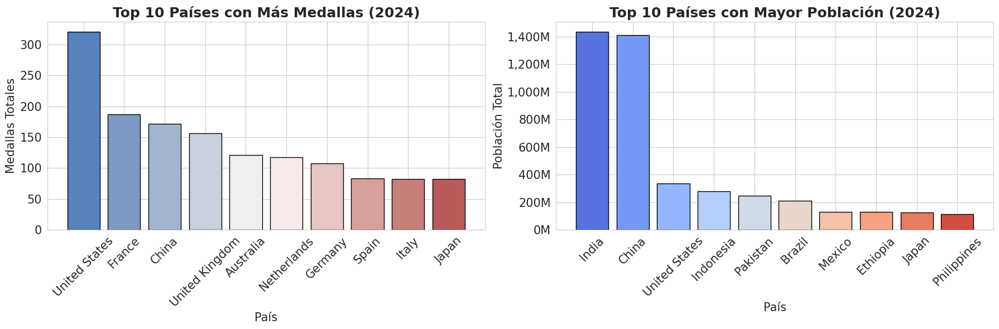

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import drive



# ... (other code for the scatter plot, if needed) ...

# --- Bar Charts ---
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Import Seaborn for styling

# Filter data for 1960 and countries with medals
df_1960 = df[df["ANOO"] == 2024]
df_filtrado = df_1960[(df_1960["MEDALLAS_TOTALES"] > 0) & (df_1960["MEDALLAS_TOTALES"] < 400)].copy()

# Sort the dataframe by total medals in descending order and get the top 10
top_10_medals = df_filtrado.sort_values(by='MEDALLAS_TOTALES', ascending=False).head(10)

# Sort the dataframe by total population in descending order and get the top 10
top_10_population = df_filtrado.sort_values(by='POBLACION_TOTAL', ascending=False).head(10)

# Set Seaborn style
sns.set_style("whitegrid")

# Create subplots with improved figsize
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

palette = sns.color_palette("vlag", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors

# --- Enhancements for Medals Bar Chart ---
axes[0].bar(top_10_medals['COUNTRY'], top_10_medals['MEDALLAS_TOTALES'], color=palette, edgecolor='black')
axes[0].set_title('Top 10 Países con Más Medallas (2024)', fontsize=18, fontweight='bold')
axes[0].set_xlabel('País', fontsize=15)
axes[0].set_ylabel('Medallas Totales', fontsize=15)
axes[0].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[0].tick_params(axis='y', labelsize=15)

palette2 = sns.color_palette("coolwarm", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors
# --- Enhancements for Population Bar Chart ---
axes[1].bar(top_10_population['COUNTRY'], top_10_population['POBLACION_TOTAL'], color=palette2, edgecolor='black')
axes[1].set_title('Top 10 Países con Mayor Población (2024)', fontsize=18, fontweight='bold')
axes[1].set_xlabel('País', fontsize=15)
axes[1].set_ylabel('Población Total', fontsize=15)
axes[1].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[1].tick_params(axis='y', labelsize=15)

# Format y-axis labels to millions (e.g., 100M)
axes[1].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,.0f}M".format(x / 1e6)))

plt.tight_layout()
plt.show()

In [ ]:
df

,COUNTRY,ANOO,POBLACION_0_14,POBLACION_TOTAL,PIB_POR_PAIS,TASA_MORTALIDAD_INFANTIL,POBLACION_20_24_VARONES,POBLACION_20_24_MUJERES,MEDALLAS_TOTALES,MEDALLAS_DE_ORO
0,Afghanistan,1960,3789907.0,9035043.0,NaN,NaN,8.97,8.80,0.0,0.0
1,Afghanistan,1964,4162207.0,9814318.0,NaN,223.9,8.84,8.71,0.0,0.0
2,Afghanistan,1968,4671648.0,10756922.0,NaN,209.3,8.79,9.07,0.0,0.0
3,Afghanistan,1972,5261617.0,11853696.0,NaN,194.8,8.34,8.68,0.0,0.0
4,Afghanistan,1976,5909060.0,13059851.0,NaN,180.0,8.31,8.40,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
3514,Zimbabwe,2008,5489264.0,12959149.0,340.74,55.6,11.11,11.66,4.0,1.0
3515,Zimbabwe,2012,6035612.0,13817887.0,1238.60,46.8,9.05,9.34,0.0,0.0
3516,Zimbabwe,2016,6365033.0,14600294.0,1407.42,40.4,7.89,8.19,0.0,0.0
3517,Zimbabwe,2020,6549831.0,15526888.0,88800.49,36.4,8.56,8.52,0.0,0.0


In [ ]:
df2

,Country,Country Name 2,Country Code,1960 Población Total 0-14,1964 Población Total 0-14,1968 Población Total 0-14,1972 Población Total 0-14,1976 Población Total 0-14,1980 Población Total 0-14,1984 Población Total 0-14,...,1996_oro,2000_oro,2004_oro,2008_oro,2012_oro,2016_oro,2020_oro,2024_oro,total_gold_medals,promedio_de_medallas_de_oro_por_país_1960-2024
0,Aruba,Aruba,ABW,23349.0,23536.0,22817.0,21249.0,18742.0,17210.0,17017.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Afghanistan,Afghanistan,AFG,3789907.0,4162207.0,4671648.0,5261617.0,5909060.0,6065314.0,5239339.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Angola,Angola,AGO,2159095.0,2354637.0,2574082.0,2856140.0,3215857.0,3634050.0,4177523.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Albania,Albania,ALB,662424.0,766535.0,854827.0,921354.0,951736.0,968929.0,1003721.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Andorra,Andorra,AND,2570.0,3642.0,5206.0,6701.0,7761.0,8365.0,8984.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
621,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


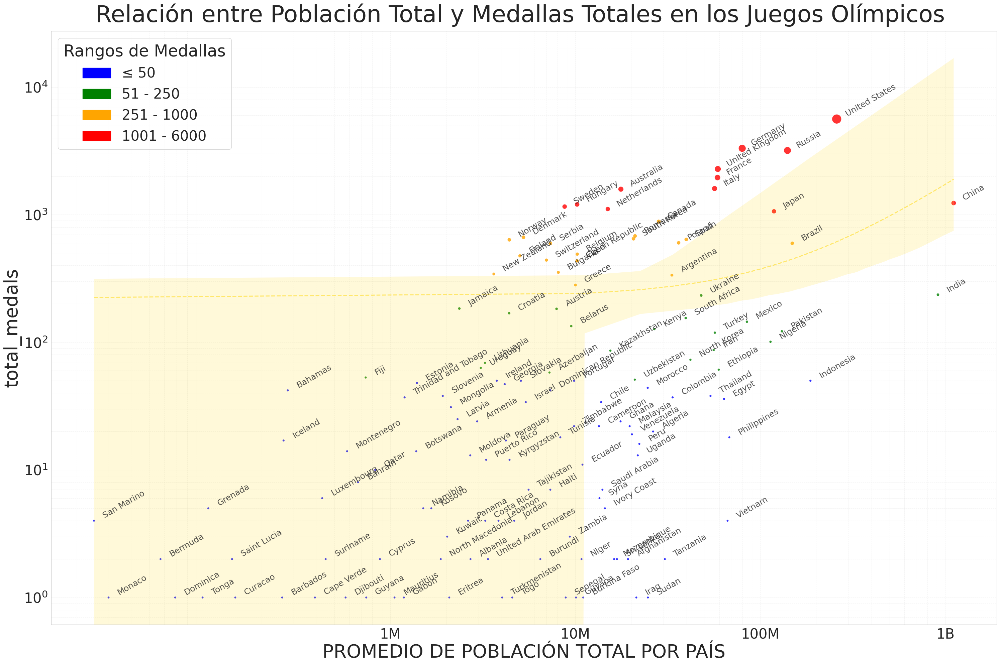

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

df_filtrado2 = df2[(df2["total_medals"] > 0) & (df2["total_medals"] < 6000)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.figure(figsize=(30, 20))

# 1. Define color thresholds and corresponding colors
thresholds = [50, 250, 1000,6000 ]  # Medal count thresholds
colors = ['blue', 'green', 'orange', 'red']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado2['color_index'] = df_filtrado2['total_medals'].apply(map_medal_to_color)

# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado2,
    x="PROMEDIO DE POBLACIÓN TOTAL POR PAÍS",
    y="total_medals",
    size="total_medals",
    sizes=(20, 400),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas',title_fontsize=35, loc='upper left',prop={'size': 30})

#
# Escala logarítmica para ambos ejes
plt.xscale('log')
plt.yscale('log')

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Ajustar ticks del eje x para mejor legibilidad
plt.xticks([1e6, 1e7, 1e8, 1e9], ['1M', '10M', '100M', '1B'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado2)):
    plt.text(
        df_filtrado2.iloc[i]["PROMEDIO DE POBLACIÓN TOTAL POR PAÍS"] * 1.1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado2.iloc[i]["total_medals"] * 1.05,
        df_filtrado2.iloc[i]["Country"],
        fontsize=18,
        alpha=0.8,
        rotation=30
    )

# Títulos y etiquetas mejoradas
plt.title("Relación entre Población Total y Medallas Totales en los Juegos Olímpicos ", pad=20,fontsize=50)
plt.xlabel("Población Total (escala logarítmica)",fontsize=40)
plt.ylabel("Medallas Totales (escala logarítmica)",fontsize=40)


# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado2,
    x="PROMEDIO DE POBLACIÓN TOTAL POR PAÍS",
    y="total_medals",
    scatter=False,
    color='gold',
    line_kws={'linestyle': '--', 'alpha': 0.5}
)

# Ajustar márgenes
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

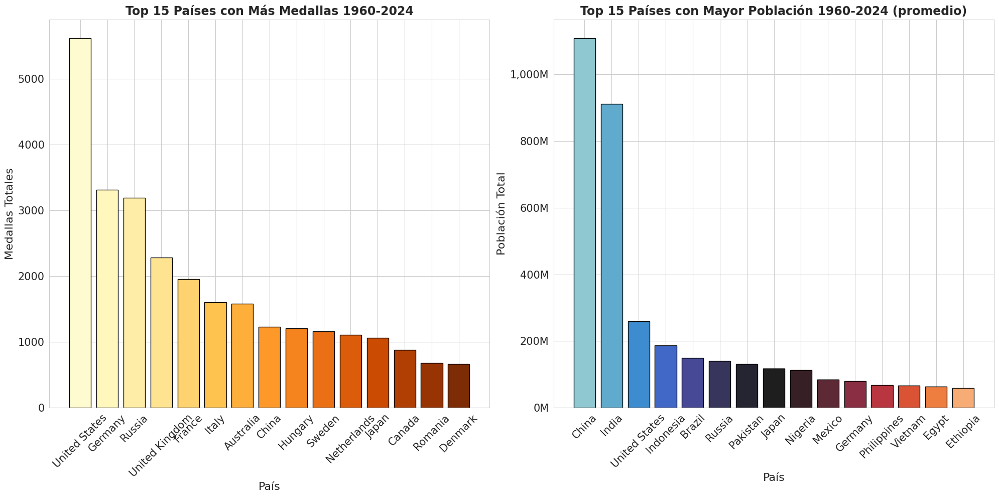

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Import Seaborn for styling

#Sort the dataframe by total medals in descending order and get the top 10
top_10_medals = df_filtrado2.sort_values(by='total_medals', ascending=False).head(15)

# Sort the dataframe by total population in descending order and get the top 10
top_10_population = df_filtrado2.sort_values(by='PROMEDIO DE POBLACIÓN TOTAL POR PAÍS', ascending=False).head(15)

# Set Seaborn style
sns.set_style("whitegrid")

# Create subplots with improved figsize
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

palette = sns.color_palette("YlOrBr", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors

# --- Enhancements for Medals Bar Chart ---
axes[0].bar(top_10_medals['Country'], top_10_medals['total_medals'], color=palette, edgecolor='black')
axes[0].set_title('Top 15 Países con Más Medallas 1960-2024', fontsize=17, fontweight='bold')
axes[0].set_xlabel('País', fontsize=16)
axes[0].set_ylabel('Medallas Totales', fontsize=16)
axes[0].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[0].tick_params(axis='y', labelsize=15)

palette2 = sns.color_palette("icefire", n_colors=len(top_10_medals))  # Get 'iris' palette with enough colors
# --- Enhancements for Population Bar Chart ---
axes[1].bar(top_10_population['Country'], top_10_population['PROMEDIO DE POBLACIÓN TOTAL POR PAÍS'], color=palette2, edgecolor='black')
axes[1].set_title('Top 15 Países con Mayor Población 1960-2024 (promedio)', fontsize=17, fontweight='bold')
axes[1].set_xlabel('País', fontsize=16)
axes[1].set_ylabel('Población Total', fontsize=16)
axes[1].tick_params(axis='x', labelsize=15, labelrotation=45)  # Use labelrotation instead of rotation and horizontalalignment
axes[1].tick_params(axis='y', labelsize=15)

# Format y-axis labels to millions (e.g., 100M)
axes[1].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,.0f}M".format(x / 1e6)))

plt.tight_layout()
plt.show()

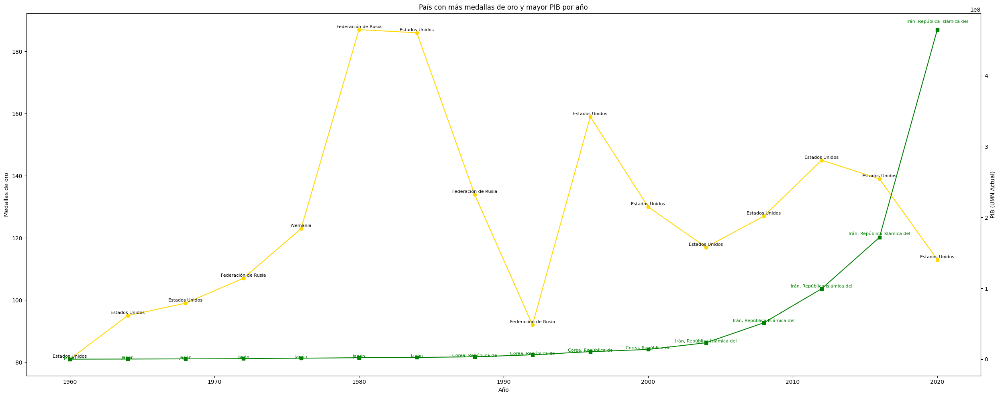

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo (ajusta la ruta si es necesario)
file_path = 'TABLAFINALCONLAQUEPUEDOHACERCOSAS.csv'
df = pd.read_csv(file_path, encoding='ISO-8859-1')

# Filtrar filas que NO sean Totales ni Mundo
df = df[~df['Country Name 2'].str.lower().isin(['totales', 'mundo'])]

# Identificar columnas de medallas de oro y PIB
oro_columns = [col for col in df.columns if '_oro' in col and 'promedio' not in col]
pib_columns = [col for col in df.columns if 'PIB por país' in col and 'promedio' not in col]

# Extraer años comunes
años_comunes = [col.split('_')[0] for col in oro_columns if f"{col.split('_')[0]} PIB por país (UMN Actual)" in pib_columns]

# Construir lista de resultados
resultados = []
for año in años_comunes:
    col_oro = f"{año}_oro"
    col_pib = f"{año} PIB por país (UMN Actual)"

    pais_mas_oro = df.loc[df[col_oro].idxmax(), 'Country Name 2']
    oro_valor = df[col_oro].max()

    pais_mas_pib = df.loc[df[col_pib].idxmax(), 'Country Name 2']
    pib_valor = df[col_pib].max()

    resultados.append({
        "Año": int(año),
        "País con más medallas de oro": pais_mas_oro,
        "Medallas de oro": oro_valor,
        "País con mayor PIB": pais_mas_pib,
        "PIB (UMN Actual)": pib_valor
    })

# Convertir a DataFrame
df_resultados = pd.DataFrame(resultados)

# Crear gráfico
fig, ax1 = plt.subplots(figsize=(25, 10))

# Medallas de oro
ax1.plot(df_resultados["Año"], df_resultados["Medallas de oro"], 'gold', marker='o', label="Medallas de oro")
for i, row in df_resultados.iterrows():
    ax1.text(row["Año"], row["Medallas de oro"] + 0.5, row["País con más medallas de oro"], ha='center', fontsize=8)

# Eje secundario para PIB
ax2 = ax1.twinx()
ax2.plot(df_resultados["Año"], df_resultados["PIB (UMN Actual)"], 'green', marker='s', label="PIB")
for i, row in df_resultados.iterrows():
    ax2.text(row["Año"], row["PIB (UMN Actual)"] * 1.02, row["País con mayor PIB"], ha='center', fontsize=8, color='green')

# Etiquetas
ax1.set_ylabel("Medallas de oro")
ax2.set_ylabel("PIB (UMN Actual)")
ax1.set_title("País con más medallas de oro y mayor PIB por año")
ax1.set_xlabel("Año")

# Mostrar gráfico
fig.tight_layout()
plt.show()


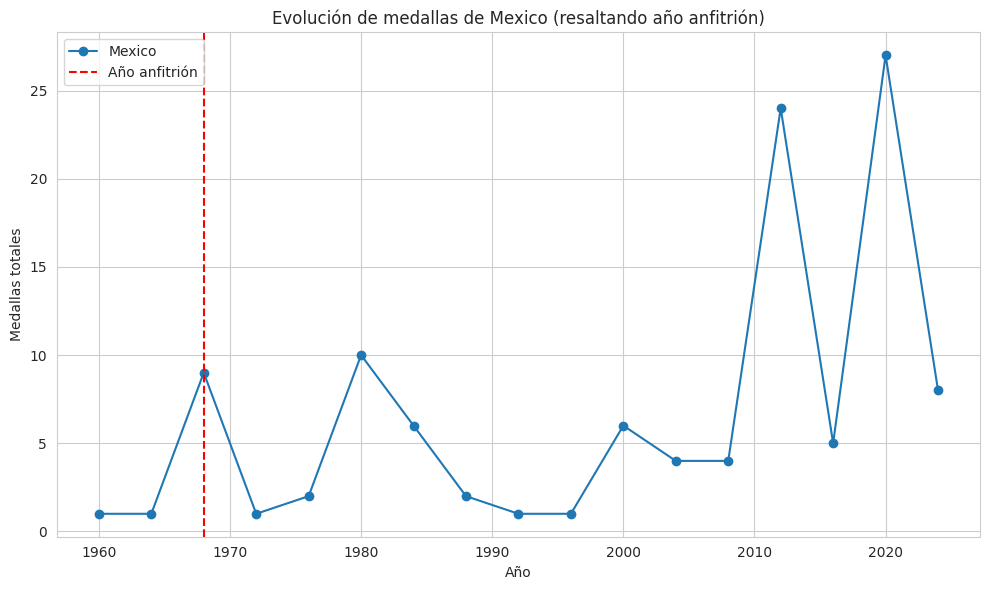

In [ ]:
# Parámetros: país y año en que fue anfitrión
pais = "Mexico"
anio_anfitrion = 1968

# Filtrar datos del país
df_pais = df[df["COUNTRY"] == pais].sort_values("ANOO")

# Crear gráfico
plt.figure(figsize=(10, 6))
plt.plot(df_pais["ANOO"], df_pais["MEDALLAS_TOTALES"], marker='o', label=f'{pais}')
plt.axvline(x=anio_anfitrion, color='red', linestyle='--', label='Año anfitrión')
plt.title(f"Evolución de medallas de {pais} (resaltando año anfitrión)")
plt.xlabel("Año")
plt.ylabel("Medallas totales")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-77-f350db2dec11>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(anfitriones))


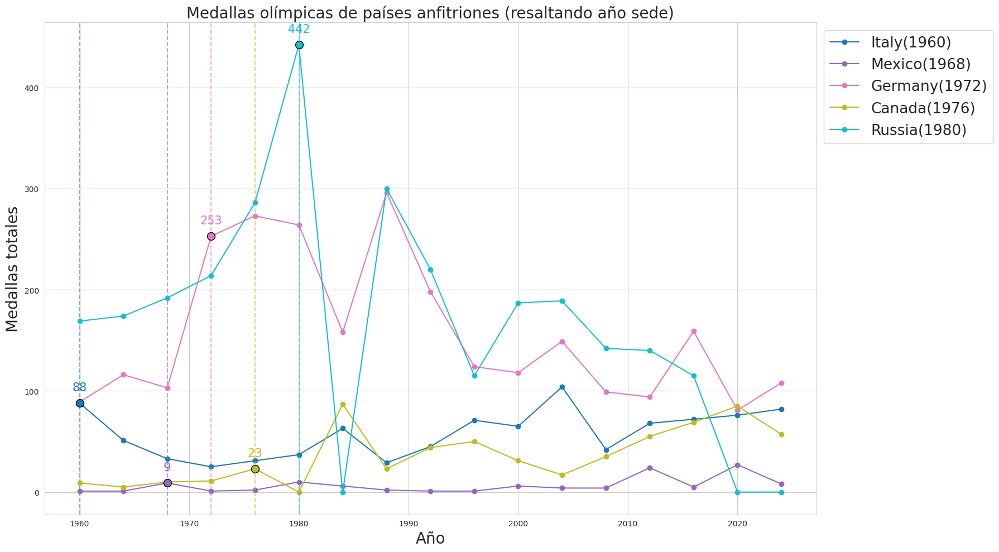

In [ ]:
# Lista de países anfitriones y sus respectivos años
anfitriones = {
    "Italy": 1960,
    "Japon": 1964,
    "Mexico": 1968,
    "Germany": 1972,
    "Canada": 1976,
    "Russia": 1980,
    # "United States": 1984,
    # "South Korea": 1988,
    # "Spain": 1992,
    # "United States": 1996,
    # "Australia": 2000,
    # "Grecia": 2004
    # "China": 2008,
    # "United Kingdom": 2012,
    # "Brazil": 2016,
    # "Japan": 2020,
    # "France": 2024,
}

# Crear figura
plt.figure(figsize=(18, 10))

# Generar colores automáticos
colors = plt.cm.get_cmap('tab10', len(anfitriones))

# Dibujar series con sus respectivos años anfitriones
for idx, (pais, anio) in enumerate(anfitriones.items()):
    df_pais = df[df["COUNTRY"] == pais].sort_values("ANOO")
    if not df_pais.empty and anio in df_pais["ANOO"].values:
        color = colors(idx)
        plt.plot(df_pais["ANOO"], df_pais["MEDALLAS_TOTALES"], marker='o', label=f'{pais}({anio})', color=color)

        # Línea vertical
        plt.axvline(x=anio, color=color, linestyle='--', alpha=0.6)

        # Punto del año anfitrión
        medallas = df_pais[df_pais["ANOO"] == anio]["MEDALLAS_TOTALES"].values[0]
        plt.scatter(anio, medallas, color=color, edgecolor='black', s=100, zorder=5)
        plt.text(anio, medallas + 10, str(medallas), color=color, ha='center', va='bottom', fontsize=15)

plt.title("Medallas olímpicas de países anfitriones (resaltando año sede)",fontsize=20)
plt.xlabel("Año",fontsize=20)
plt.ylabel("Medallas totales",fontsize=20)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1),fontsize=19, title_fontsize=19)
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-75-f6c139f81d59>:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('Dark2_r', len(anfitriones))


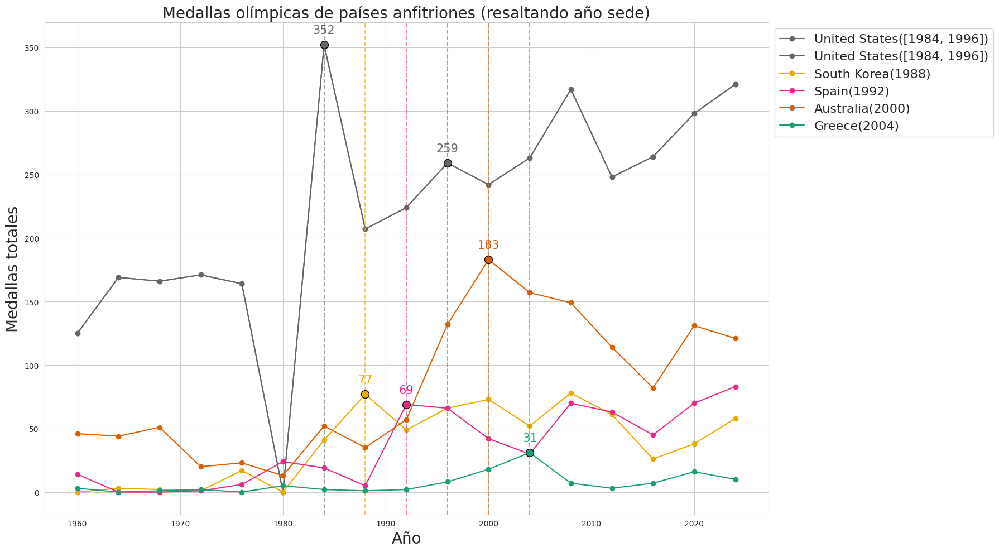

In [ ]:
# Lista de países anfitriones y sus respectivos años
anfitriones = {
     "United States": [1984,1996],
     "South Korea": 1988,
     "Spain": 1992,
     #"United States": 1996,
     "Australia": 2000,
    "Greece": 2004
}

# Crear figura
plt.figure(figsize=(18, 10))

# Generar colores automáticos
colors = plt.cm.get_cmap('Dark2_r', len(anfitriones))

# Dibujar series con sus respectivos años anfitriones
for idx, (pais, anio) in enumerate(anfitriones.items()):
    df_pais = df[df["COUNTRY"] == pais].sort_values("ANOO")
    # Check if anio is a list (for countries with multiple host years)
    if isinstance(anio, list):
        # Iterate over the list of years
        for year in anio:
            if not df_pais.empty and year in df_pais["ANOO"].values:
                color = colors(idx)
                plt.plot(df_pais["ANOO"], df_pais["MEDALLAS_TOTALES"], marker='o', label=f'{pais}({anio})', color=color)

                # Línea vertical
                plt.axvline(x=year, color=color, linestyle='--', alpha=0.6)

                # Punto del año anfitrión
                medallas = df_pais[df_pais["ANOO"] == year]["MEDALLAS_TOTALES"].values[0]
                plt.scatter(year, medallas, color=color, edgecolor='black', s=100, zorder=5)
                plt.text(year, medallas + 7, str(medallas), color=color, ha='center', va='bottom', fontsize=15)
    else:  # If anio is a single year
        if not df_pais.empty and anio in df_pais["ANOO"].values:
            color = colors(idx)
            plt.plot(df_pais["ANOO"], df_pais["MEDALLAS_TOTALES"], marker='o', label=f'{pais}({anio})', color=color)

            # Línea vertical
            plt.axvline(x=anio, color=color, linestyle='--', alpha=0.6)

            # Punto del año anfitrión
            medallas = df_pais[df_pais["ANOO"] == anio]["MEDALLAS_TOTALES"].values[0]
            plt.scatter(anio, medallas, color=color, edgecolor='black', s=100, zorder=5)
            plt.text(anio, medallas + 7, str(medallas), color=color, ha='center', va='bottom', fontsize=15)

plt.title("Medallas olímpicas de países anfitriones (resaltando año sede)",fontsize=20)
plt.xlabel("Año", fontsize=20)
plt.ylabel("Medallas totales",fontsize=20)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1),fontsize=16, title_fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

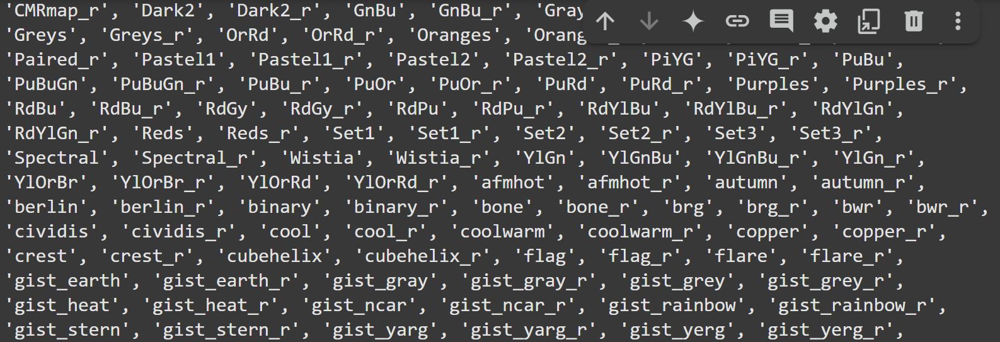

<ipython-input-74-0b38927b9010>:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(anfitriones))


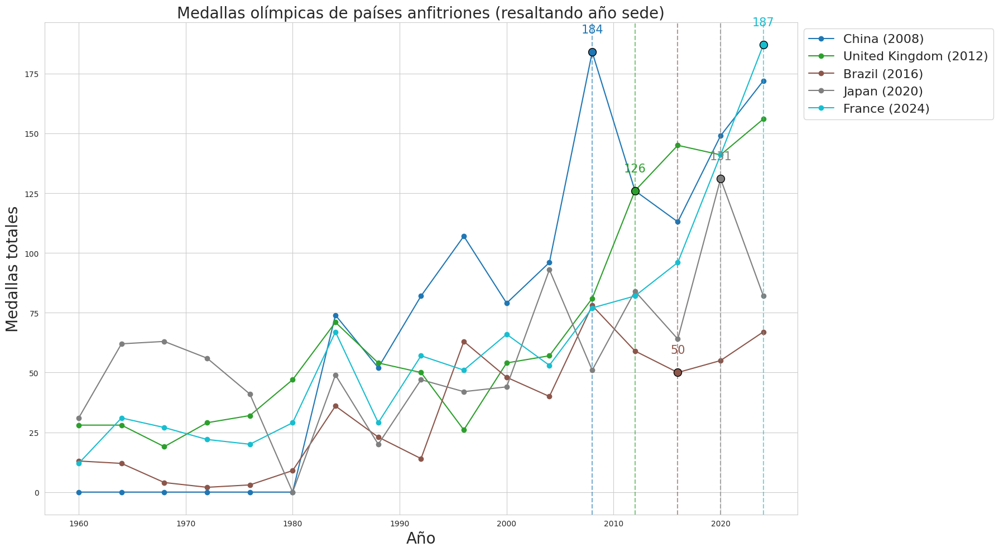

In [ ]:
# Lista de países anfitriones y sus respectivos años
anfitriones = {

     "China": 2008,
     "United Kingdom": 2012,
     "Brazil": 2016,
     "Japan": 2020,
     "France": 2024,
}

# Crear figura
plt.figure(figsize=(18, 10))

# Generar colores automáticos
colors = plt.cm.get_cmap('tab10', len(anfitriones))

# Dibujar series con sus respectivos años anfitriones
for idx, (pais, anio) in enumerate(anfitriones.items()):
    df_pais = df[df["COUNTRY"] == pais].sort_values("ANOO")
    if not df_pais.empty and anio in df_pais["ANOO"].values:
        color = colors(idx)
        plt.plot(df_pais["ANOO"], df_pais["MEDALLAS_TOTALES"], marker='o', label=f'{pais} ({anio})', color=color)

        # Línea vertical
        plt.axvline(x=anio, color=color, linestyle='--', alpha=0.6)

        # Punto del año anfitrión
        medallas = df_pais[df_pais["ANOO"] == anio]["MEDALLAS_TOTALES"].values[0]
        plt.scatter(anio, medallas, color=color, edgecolor='black', s=100, zorder=5)
        plt.text(anio, medallas + 7, str(medallas), color=color, ha='center', va='bottom', fontsize=15)

plt.title("Medallas olímpicas de países anfitriones (resaltando año sede)",fontsize=20)
plt.xlabel("Año",fontsize=20)
plt.ylabel("Medallas totales",fontsize=20)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1),fontsize=16, title_fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()


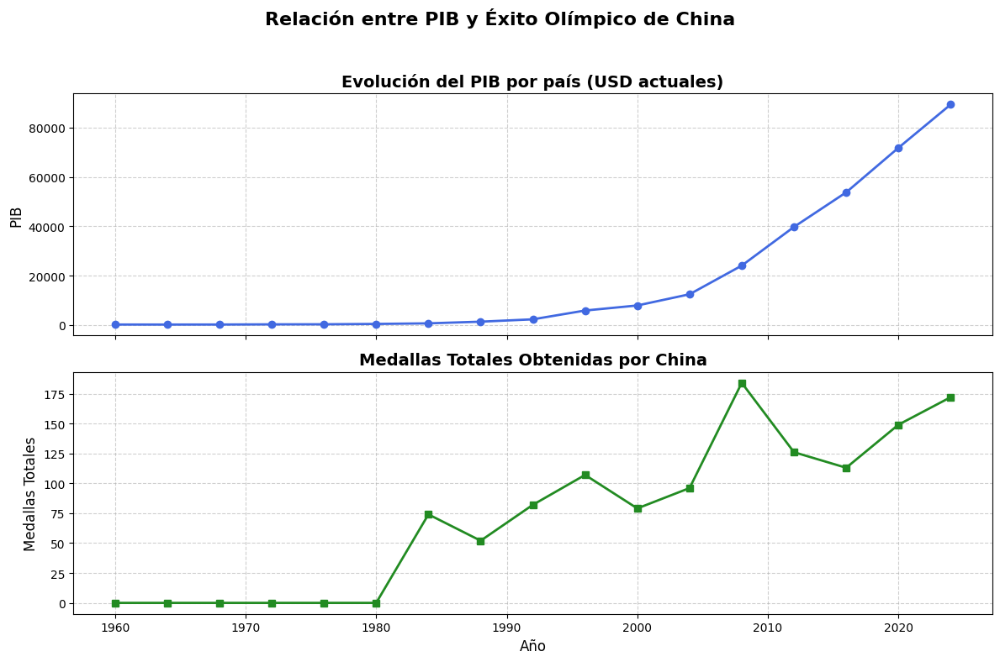

In [ ]:
#Filtrar datos para China
df_china = df[df["COUNTRY"] == "China"].sort_values("ANOO")

# Crear figura y subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 1]})

# Gráfico de PIB
axes[0].plot(df_china["ANOO"], df_china["PIB_POR_PAIS"], color='royalblue', marker='o', linewidth=2)
axes[0].set_title("Evolución del PIB por país (USD actuales)", fontsize=14, fontweight='bold')
axes[0].set_ylabel("PIB", fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)

# Gráfico de Medallas Totales
axes[1].plot(df_china["ANOO"], df_china["MEDALLAS_TOTALES"], color='forestgreen', marker='s', linewidth=2)
axes[1].set_title("Medallas Totales Obtenidas por China", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Año", fontsize=12)
axes[1].set_ylabel("Medallas Totales", fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)

# Ajustes generales
plt.suptitle("Relación entre PIB y Éxito Olímpico de China", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


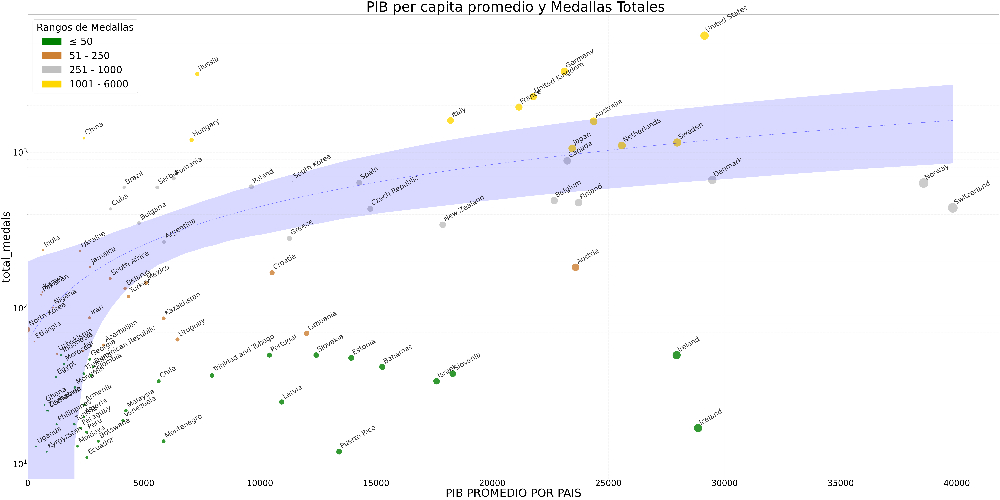

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

df_filtrado3 = df3[(df3["total_medals"] > 10) & (df3["total_medals"] < 6000)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.style.use("default")
plt.figure(figsize=(100, 50))

# 1. Define color thresholds and corresponding colors
thresholds = [50, 250, 1000,6000 ]  # Medal count thresholds
colors = ['green', '#CD7F32', '#C0C0C0', 'gold']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado3['color_index'] = df_filtrado3['total_medals'].apply(map_medal_to_color)

# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado3,
    x="PIB PROMEDIO POR PAIS",
    y="total_medals",
    size="PIB PROMEDIO POR PAÍS",
    sizes=(100, 5000),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas',title_fontsize=70, loc='upper left',prop={'size': 70})

#
# Escala logarítmica para ambos ejes
#plt.xscale('log')
plt.yscale('log')

plt.xticks(fontsize=60)
plt.yticks(fontsize=60)

# Ajustar ticks del eje x para mejor legibilidad
#plt.xticks([1e2, 1e3, 1e4, 1e5], ['100', '1000', '10000', '100000'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado3)):
    plt.text(
        df_filtrado3.iloc[i]["PIB PROMEDIO POR PAIS"] * 1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado3.iloc[i]["total_medals"] * 1.05,
        df_filtrado3.iloc[i]["Country"],
        fontsize=50,
        alpha=0.8,
        rotation=30
    )

# Títulos y etiquetas mejoradas
plt.title(" PIB per capita promedio y Medallas Totales", pad=20,fontsize=100)
plt.xlabel("Pib per capita promedio",fontsize=80)
plt.ylabel("Medallas Totales (escala logarítmica)",fontsize=80)


# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado3,
    x="PIB PROMEDIO POR PAIS",
    y="total_medals",
    scatter=False,
    color='blue',
    line_kws={'linestyle': 'dashdot', 'alpha': 0.5}
)

# Ajustar márgenes
# Ajustar el límite del eje X para incluir a países con PIB muy alto
max_pib = df_filtrado3["PIB PROMEDIO POR PAIS"].max()
plt.xlim(0, max_pib * 1.05)  # Extiende un 10% más allá del máximo para dejar espacio
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

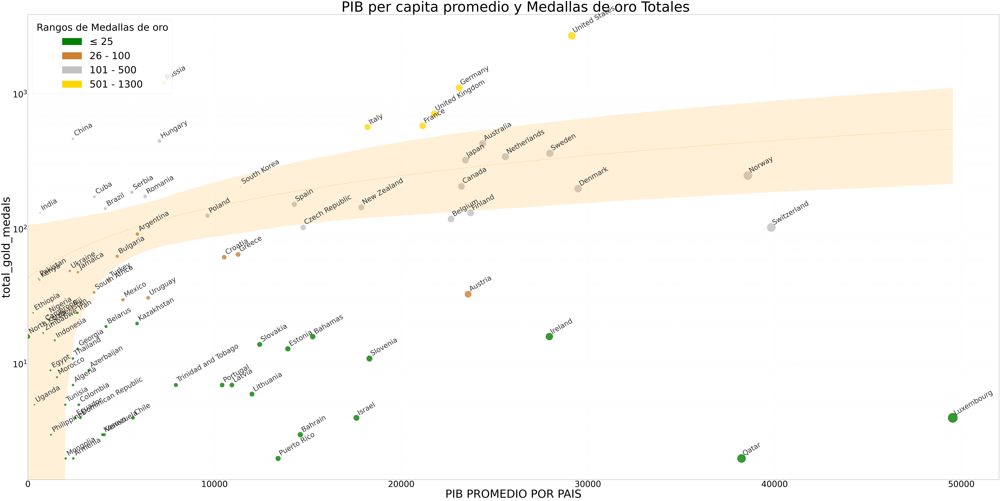

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

df_filtrado3 = df3[(df3["total_gold_medals"] > 1) & (df3["total_gold_medals"] < 3000)].copy()  # Todos los países con al menos 1 medalla
#Crear figura más grande
plt.style.use("default")
plt.figure(figsize=(100, 50))

# 1. Define color thresholds and corresponding colors
thresholds = [25, 100, 500,1300 ]  # Medal count thresholds
colors = ['green', '#CD7F32', '#C0C0C0', 'gold']  # Corresponding colors

# 2. Create a custom colormap
cmap = mcolors.ListedColormap(colors)

# 3. Create a function to map medal counts to colors
def map_medal_to_color(medals):
    for i, threshold in enumerate(thresholds):
        if medals <= threshold:
            return i  # Return the index of the corresponding color
    return len(thresholds) - 1  # Return the last color index for values above the last threshold

# 4. Apply the function to create a color column in your DataFrame
df_filtrado3['color_index'] = df_filtrado3['total_gold_medals'].apply(map_medal_to_color)

# 5. Create the scatter plot using the custom colormap and color column
scatter = sns.scatterplot(
    data=df_filtrado3,
    x="PIB PROMEDIO POR PAIS",
    y="total_gold_medals",
    size="PIB PROMEDIO POR PAÍS",
    sizes=(100, 5000),
    hue='color_index',  # Use the color column for hue
    palette=cmap,
    alpha=0.8  # Remove the default legend
)
# 1. Create legend handles
legend_handles = []
for i, threshold in enumerate(thresholds):
    if i == 0:
        label = f"≤ {threshold}"  # Label for the first threshold
    else:
        label = f"{thresholds[i-1] + 1} - {threshold}"  # Label for other thresholds
    legend_handles.append(mpatches.Patch(color=colors[i], label=label))

# 2. Add the legend to the plot
plt.legend(handles=legend_handles, title='Rangos de Medallas de oro',title_fontsize=70, loc='upper left',prop={'size': 70})

#
# Escala logarítmica para ambos ejes
#plt.xscale('log')
plt.yscale('log')

plt.xticks(fontsize=60)
plt.yticks(fontsize=60)

# Ajustar ticks del eje x para mejor legibilidad
#plt.xticks([1e2, 1e3, 1e4, 1e5], ['100', '1000', '10000', '100000'])

# Etiquetar todos los países (o los más importantes)
for i in range(len(df_filtrado3)):
    plt.text(
        df_filtrado3.iloc[i]["PIB PROMEDIO POR PAIS"] * 1,  # Pequeño desplazamiento para evitar solapamiento
        df_filtrado3.iloc[i]["total_gold_medals"] * 1.05,
        df_filtrado3.iloc[i]["Country"],
        fontsize=50,
        alpha=0.8,
        rotation=30
    )

# Títulos y etiquetas mejoradas
plt.title(" PIB per capita promedio y Medallas de oro Totales", pad=20,fontsize=100)
plt.xlabel("Pib per capita promedio",fontsize=80)
plt.ylabel("Medallas de oro Totales (escala logarítmica)",fontsize=80)


# Línea de tendencia para mostrar correlación
sns.regplot(
    data=df_filtrado3,
    x="PIB PROMEDIO POR PAIS",
    y="total_gold_medals",
    scatter=False,
    color='orange',
    line_kws={'linestyle': 'dashdot', 'alpha': 0.5}
)

# Ajustar márgenes
# Ajustar el límite del eje X para incluir a países con PIB muy alto
max_pib = df_filtrado3["PIB PROMEDIO POR PAIS"].max()
plt.xlim(0, max_pib * 1.05)  # Extiende un 10% más allá del máximo para dejar espacio
plt.tight_layout()
plt.grid(True, which="both", ls="--", alpha=0.2)
plt.show()

<ipython-input-27-7c3b26d94e05>:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats = df_box.groupby("PIB_CUARTIL").agg(
<ipython-input-27-7c3b26d94e05>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


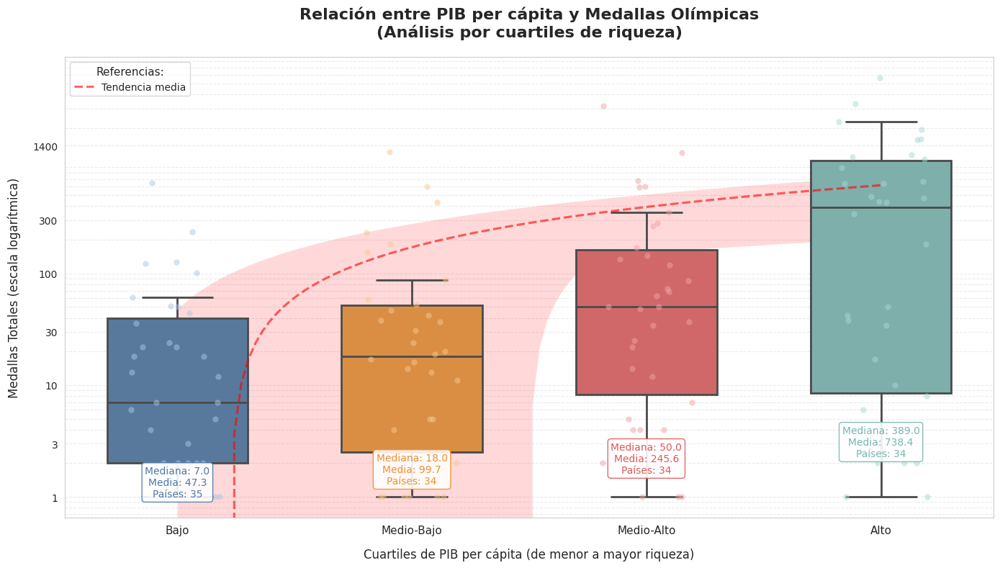

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear cuartiles del PIB
#df_box = df4[df4["MEDALLAS_TOTALES"] > 0].copy()
df_box = df3[(df3["total_medals"] > 0) & (df3["total_medals"] < 6000)].copy()
df_box["PIB_CUARTIL"] = pd.qcut(df_box["PIB PROMEDIO POR PAÍS"], q=4, labels=["Bajo", "Medio-Bajo", "Medio-Alto", "Alto"])

# Calcular estadísticas CORRECTAS por grupo
stats = df_box.groupby("PIB_CUARTIL").agg(
    Mediana=("total_medals", "median"),
    Media=("total_medals", "mean"),
    Paises=("total_medals", "count")
).reset_index()

# Configuración de estilo mejorada
plt.figure(figsize=(14, 8))
sns.set_style("whitegrid")
palette = {"Bajo": "#4e79a7", "Medio-Bajo": "#f28e2b", "Medio-Alto": "#e15759", "Alto": "#76b7b2"}
point_palette = {"Bajo": "#a7c7e7", "Medio-Bajo": "#f8c78e", "Medio-Alto": "#f0a3a4", "Alto": "#a8d8d5"}

# Crear boxplot con colores diferenciados
ax = sns.boxplot(
    data=df_box,
    x="PIB_CUARTIL",
    y="total_medals",
    palette=palette,
    width=0.6,
    showfliers=False,
    linewidth=2
)

# Añadir puntos con colores correspondientes a cada grupo
for i, level in enumerate(["Bajo", "Medio-Bajo", "Medio-Alto", "Alto"]):
    subset = df_box[df_box["PIB_CUARTIL"] == level]
    sns.stripplot(
        data=subset,
        x="PIB_CUARTIL",
        y="total_medals",
        color=point_palette[level],
        alpha=0.5,
        size=6,
        jitter=0.2,
        ax=ax
    )

# Escala logarítmica y títulos
plt.yscale("log")
plt.title("Relación entre PIB per cápita y Medallas Olímpicas\n(Análisis por cuartiles de riqueza)",
         fontsize=16, pad=20, fontweight='bold')
plt.xlabel("Cuartiles de PIB per cápita (de menor a mayor riqueza)", fontsize=12, labelpad=12)
plt.ylabel("Medallas Totales (escala logarítmica)", fontsize=12, labelpad=12)

# Añadir anotaciones CORRECTAS con formato mejorado
for i, row in stats.iterrows():
    ax.text(
        i,
        np.log10(row["Mediana"]) + 0.5,
        f"Mediana: {row['Mediana']:.1f}\nMedia: {row['Media']:.1f}\nPaíses: {row['Paises']}",
        ha='center',
        va='center',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor=palette[row["PIB_CUARTIL"]]),
        fontsize=10,
        color=palette[row["PIB_CUARTIL"]]
    )

# Línea de tendencia con regresión lineal
sns.regplot(
    x=np.arange(4),
    y=stats["Media"],
    scatter=False,
    color='red',
    line_kws={'linestyle':'--', 'alpha':0.6},
    label='Tendencia media'
)
plt.ylabel("Medallas Totales (escala logarítmica)", fontsize=12, labelpad=12)
# Mejorar los ticks y leyenda
yticks = [1, 3, 10, 30, 100, 300, 1400]
plt.yticks(yticks, [f"{y}" for y in yticks], fontsize=10)
plt.xticks(fontsize=11)
plt.legend(title="Referencias:", title_fontsize=11)

# Añadir interpretación


plt.grid(True, linestyle='--', alpha=0.4, which='both', axis='y')
plt.tight_layout()
plt.show()


=== CUARTIL BAJO ===
Rango PIB: 0.00 - 2007.43


<ipython-input-24-3ed3d92eaac4>:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stats = df_box.groupby("PIB_CUARTIL").agg(


,Country,total_medals,PIB PROMEDIO POR PAÍS
0,South Korea,648,0.000000
1,India,236,656.085959
2,Kenya,127,626.695112
3,Pakistan,122,578.612874
4,Nigeria,101,1077.434998
5,Ethiopia,61,283.658498
6,Uzbekistan,51,1267.530540
7,Indonesia,50,1445.542447
8,Morocco,44,1560.405741
9,Egypt,36,1215.864768



Total países: 35
Medallas totales: 1654

=== CUARTIL MEDIO-BAJO ===
Rango PIB: 2026.99 - 4151.92


,Country,total_medals,PIB PROMEDIO POR PAÍS
0,China,1234,2418.904418
1,Brazil,597,4151.918500
2,Cuba,434,3568.003953
3,Ukraine,233,2249.806205
4,Jamaica,184,2681.107014
5,South Africa,155,3548.368805
6,Iran,87,2659.164085
7,Azerbaijan,58,3269.029670
8,Fiji,53,2372.328348
9,Georgia,47,2670.216931



Total países: 34
Medallas totales: 3390

=== CUARTIL MEDIO-ALTO ===
Rango PIB: 4191.15 - 14026.99


,Country,total_medals,PIB PROMEDIO POR PAÍS
0,Russia,3188,7291.589864
1,Hungary,1204,7052.865574
2,Romania,681,6285.242955
3,Poland,602,9631.055003
4,Serbia,596,5572.962444
5,Bulgaria,353,4791.477041
6,Greece,281,11265.200150
7,Argentina,266,5868.081617
8,Croatia,169,10519.324060
9,Mexico,145,5097.053128



Total países: 34
Medallas totales: 8350

=== CUARTIL ALTO ===
Rango PIB: 14274.33 - 104259.90


,Country,total_medals,PIB PROMEDIO POR PAÍS
0,United States,5621,29136.21666
1,Germany,3315,23100.33321
2,United Kingdom,2282,21768.03715
3,France,1955,21147.89001
4,Italy,1604,18200.24062
5,Australia,1585,24362.10873
6,Sweden,1158,27960.00228
7,Netherlands,1108,25578.09529
8,Japan,1063,23438.06629
9,Canada,883,23223.39726


<ipython-input-24-3ed3d92eaac4>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
<ipython-input-24-3ed3d92eaac4>:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(



Total países: 34
Medallas totales: 25105


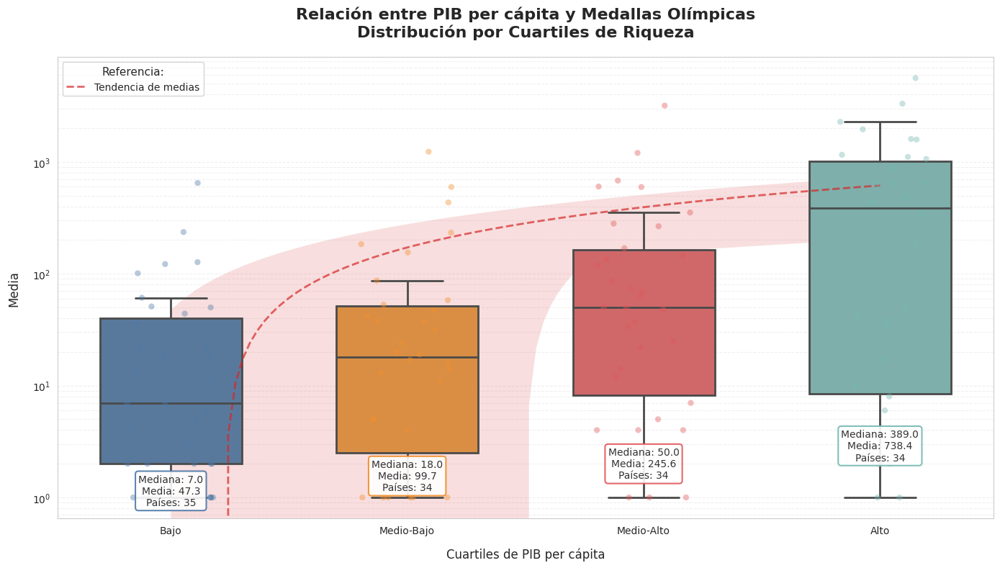

from matplotlib import pyplot as plt
_df_0['total_medals'].plot(kind='hist', bins=20, title='total_medals')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['PIB PROMEDIO POR PAÍS'].plot(kind='hist', bins=20, title='PIB PROMEDIO POR PAÍS')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2.plot(kind='scatter', x='total_medals', y='PIB PROMEDIO POR PAÍS', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['total_medals'].plot(kind='line', figsize=(8, 4), title='total_medals')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_4['PIB PROMEDIO POR PAÍS'].plot(kind='line', figsize=(8, 4), title='PIB PROMEDIO POR PAÍS')
plt.gca().spines[['top', 'right']].set_visible(False)

Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from IPython.display import display

# Filtrar y crear cuartiles
df_box = df3[(df3["total_medals"] > 0) & (df3["total_medals"] < 6000)].copy()
df_box["PIB_CUARTIL"], bins = pd.qcut(df_box["PIB PROMEDIO POR PAÍS"], q=4,
                                    labels=["Bajo", "Medio-Bajo", "Medio-Alto", "Alto"],
                                    retbins=True)

# 1. Calcular estadísticas por grupo
stats = df_box.groupby("PIB_CUARTIL").agg(
    Mediana=("total_medals", "median"),
    Media=("total_medals", "mean"),
    Paises=("total_medals", "count"),
    Min_PIB=("PIB PROMEDIO POR PAÍS", "min"),
    Max_PIB=("PIB PROMEDIO POR PAÍS", "max")
).reset_index()

# 2. Crear tablas detalladas por cuartil
tables = {}
for cuartil in ["Bajo", "Medio-Bajo", "Medio-Alto", "Alto"]:
    tables[cuartil] = (df_box[df_box["PIB_CUARTIL"] == cuartil]
                      [["Country", "total_medals", "PIB PROMEDIO POR PAÍS"]]
                      .sort_values("total_medals", ascending=False)
                      .reset_index(drop=True))

    # Mostrar top 5 y resumen
    print(f"\n=== CUARTIL {cuartil.upper()} ===")
    print(f"Rango PIB: {stats[stats['PIB_CUARTIL']==cuartil]['Min_PIB'].values[0]:.2f} - "
          f"{stats[stats['PIB_CUARTIL']==cuartil]['Max_PIB'].values[0]:.2f}")
    display(tables[cuartil].head(10))
    print(f"\nTotal países: {len(tables[cuartil])}")
    print(f"Medallas totales: {tables[cuartil]['total_medals'].sum()}")

# 3. Gráfico mejorado
plt.figure(figsize=(14, 8))
sns.set_style("whitegrid")
palette = {"Bajo": "#4e79a7", "Medio-Bajo": "#f28e2b", "Medio-Alto": "#e15759", "Alto": "#76b7b2"}

ax = sns.boxplot(
    data=df_box,
    x="PIB_CUARTIL",
    y="total_medals",
    palette=palette,
    width=0.6,
    showfliers=False,
    linewidth=2
)

# Puntos con transparencia
sns.stripplot(
    data=df_box,
    x="PIB_CUARTIL",
    y="total_medals",
    palette=palette,
    alpha=0.4,
    size=6,
    jitter=0.2
)

# Configuración del gráfico
plt.yscale("log")
plt.title("Relación entre PIB per cápita y Medallas Olímpicas\nDistribución por Cuartiles de Riqueza",
         fontsize=16, pad=20, fontweight='bold')
plt.xlabel("Cuartiles de PIB per cápita", fontsize=12, labelpad=12)
plt.ylabel("Medallas Totales (escala logarítmica)", fontsize=12, labelpad=12)

# Anotaciones con estadísticas
for i, row in stats.iterrows():
    ax.text(
        i,
        np.log10(row["Mediana"]) + 0.3,
        f"Mediana: {row['Mediana']:.1f}\nMedia: {row['Media']:.1f}\nPaíses: {row['Paises']}",
        ha='center',
        va='center',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.9,
                 edgecolor=palette[row["PIB_CUARTIL"]], linewidth=1.5),
        fontsize=10,
        color='#333333'
    )

# Línea de tendencia
sns.regplot(
    x=np.arange(4),
    y=stats["Media"],
    scatter=False,
    color='#d62728',
    line_kws={'linestyle':'--', 'alpha':0.7, 'linewidth':2},
    label='Tendencia de medias'
)

# Ajustes finales
plt.legend(title="Referencia:", title_fontsize=11)
plt.grid(True, linestyle='--', alpha=0.3, which='both', axis='y')
plt.tight_layout()
plt.show()

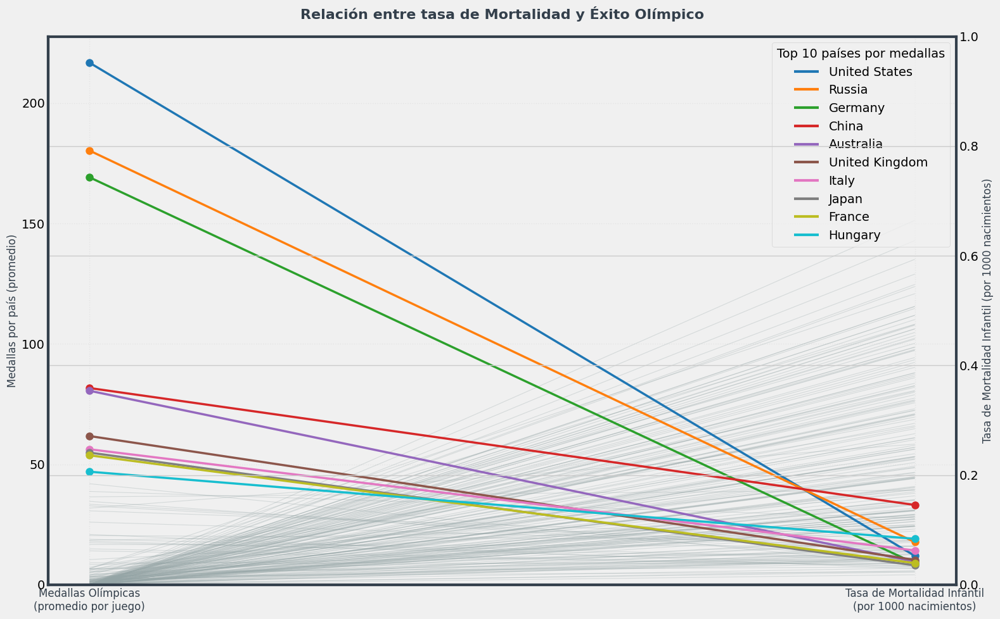

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# Configuración de estilo
#plt.style.use('seaborn-whitegrid')
plt.rcParams['font.family'] = 'sans-serif'
#plt.rcParams['axes.edgecolor'] = '#333F4B'

# Ordenar datos por mortalidad infantil
data = data.sort_values('TASA_MORTALIDAD_INFANTIL')

# Seleccionar top 10 países con más medallas
top_countries = data.sort_values('MEDALLAS_TOTALES_POR_PAIS_POR_AÑO', ascending=False).head(10)
top_list = top_countries['COUNTRY'].tolist()

# Paleta de colores distintivos para los top países
colors = plt.cm.tab10.colors[:len(top_list)]

# Crear figura
fig, ax = plt.subplots(figsize=(16, 10))
plt.subplots_adjust(left=0.1, right=0.85, top=0.9, bottom=0.1)

# ... (previous code remains the same)

# Dibujar todas las líneas grises primero (países no destacados)
for idx, row in data[~data['COUNTRY'].isin(top_list)].iterrows():
    ax.plot([0, 1],
            [row['MEDALLAS_TOTALES_POR_PAIS_POR_AÑO'], row['TASA_MORTALIDAD_INFANTIL']], # Order corrected here
            color='#95A5A6', alpha=0.3, linewidth=0.8, zorder=1)

# Dibujar países top con colores distintos
for idx, (country, color) in enumerate(zip(top_list, colors)):
    row = data[data['COUNTRY'] == country].iloc[0]

    # Línea principal
    ax.plot([0, 1],
            [row['MEDALLAS_TOTALES_POR_PAIS_POR_AÑO'], row['TASA_MORTALIDAD_INFANTIL']], # Order corrected here
            color=color, linewidth=2.5, marker='o', markersize=8, zorder=3)

# ... (the rest of the code remains the same)
    # # Etiqueta izquierda (mortalidad infantil)
    # ax.text(-0.02, row['TASA_MORTALIDAD_INFANTIL'], country,
    #         fontsize=10, va='center', ha='right', color=color,
    #         bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=2))

    # # Etiqueta derecha (medallas)
    # ax.text(1.02, row['MEDALLAS_TOTALES_POR_PAIS_POR_AÑO'], f"{country} ({row['MEDALLAS_TOTALES_POR_PAIS_POR_AÑO']:.1f})",
    #         fontsize=10, va='center', color=color,
    #         bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=2))

ax.set_xticks([0, 1])
ax.set_xticklabels(['Medallas Olímpicas\n(promedio por juego)',
                   'Tasa de Mortalidad Infantil\n(por 1000 nacimientos)'],
                  fontsize=12, color='#333F4B')

# Configurar eje Y izquierdo (Mortalidad infantil)
ax.set_ylabel('Medallas por país (promedio)', fontsize=12, color='#333F4B')
ax.set_ylim(bottom=0)

# Configurar eje Y derecho (Medallas)
ax2 = ax.twinx()
ax2.set_ylabel('Tasa de Mortalidad Infantil (por 1000 nacimientos)', fontsize=12, color='#333F4B')
ax2.set_ylim(bottom=0)

# Título y subtítulo
plt.title('Relación entre tasa de Mortalidad y Éxito Olímpico',
          fontsize=16, pad=20, color='#333F4B', weight='bold')
#plt.figtext(0.5, 0.93, 'Países con menor mortalidad infantil tienden a obtener más medallas olímpicas',
           # ha='center', fontsize=12, color='#7F8C8D')

# Crear leyenda personalizada
legend_elements = [Line2D([0], [0], color=colors[i], lw=3, label=f'{country}')
                  for i, country in enumerate(top_list)]
ax.legend(handles=legend_elements, loc='upper right',
          title='Top 10 países por medallas', frameon=True)

# Ajustar grid y bordes
ax.grid(True, linestyle=':', alpha=0.3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

<ipython-input-35-a60c5b826750>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-35-a60c5b826750>:16: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


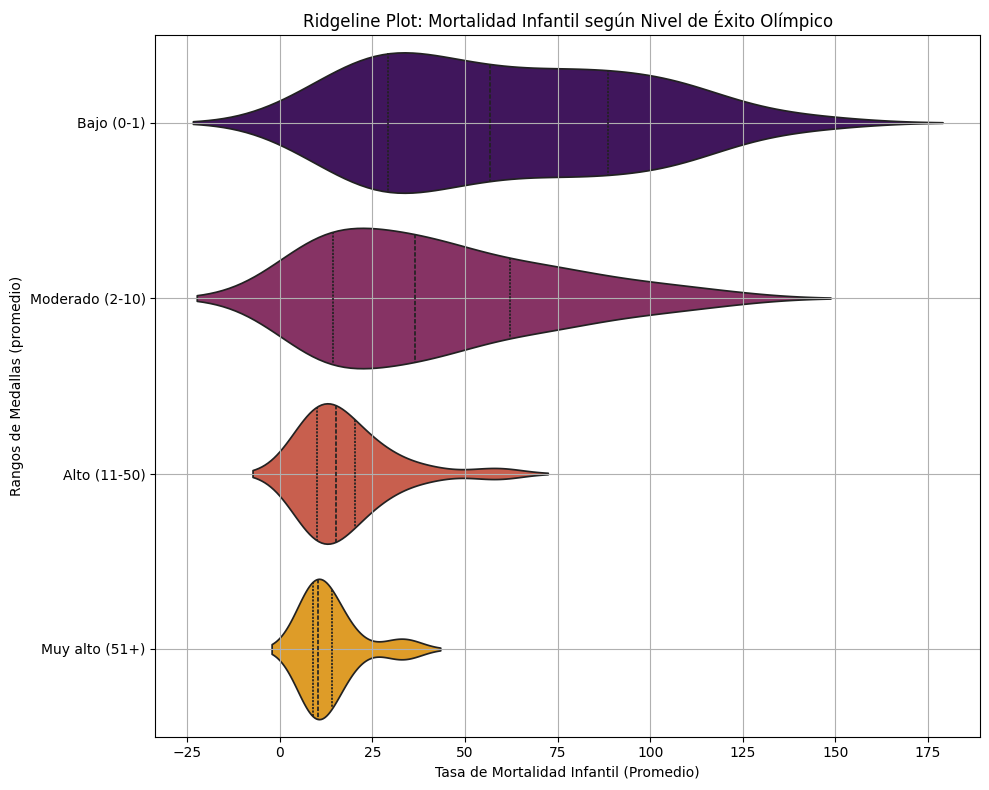

In [ ]:
import matplotlib as mpl
# =================================================================================
# 3. RIDGELINE PLOT
# =================================================================================
plt.style.use('default')
mpl.rcdefaults()
# Crear una nueva categoría basada en el promedio de medallas
data['Nivel_Exito'] = pd.cut(
    data['MEDALLAS_TOTALES_POR_PAIS_POR_AÑO'],
    bins=[-0.01, 1, 10, 50, 500],
    labels=['Bajo (0-1)', 'Moderado (2-10)', 'Alto (11-50)', 'Muy alto (51+)']
)

# Crear el ridgeline (violin plot en seaborn)
plt.figure(figsize=(10,8))
sns.violinplot(
    y='Nivel_Exito',
    x='TASA_MORTALIDAD_INFANTIL',
    data=data,
    scale='width',
    inner='quartile',
    palette="inferno"
)
plt.title('Ridgeline Plot: Mortalidad Infantil según Nivel de Éxito Olímpico')
plt.xlabel('Tasa de Mortalidad Infantil (Promedio)')
plt.ylabel('Rangos de Medallas (promedio)')
plt.grid(True)
plt.tight_layout()
plt.show()

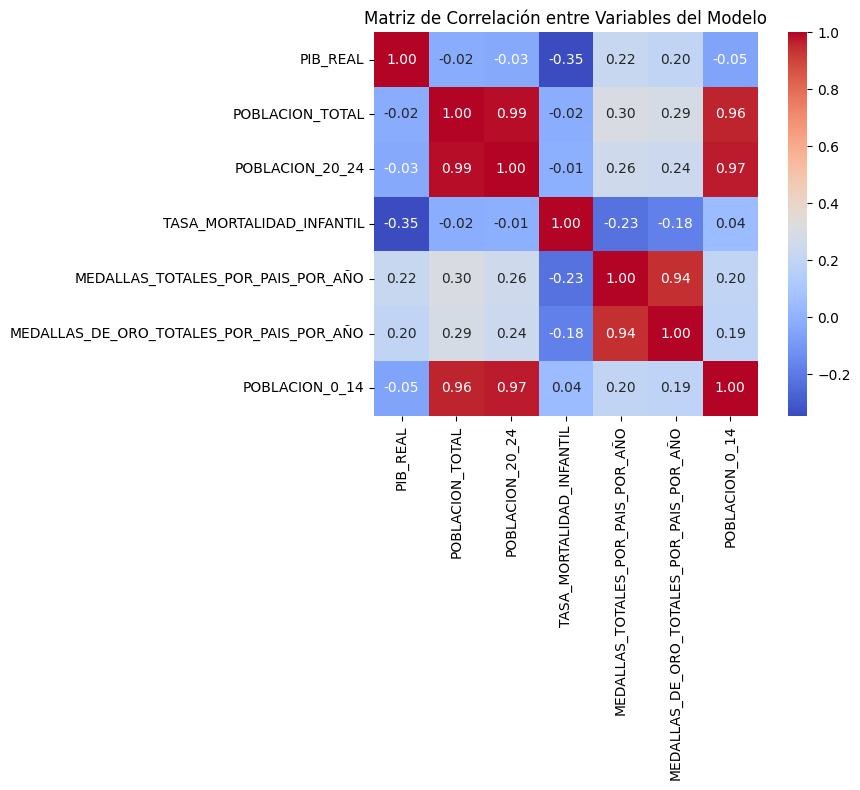

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



# Seleccionar las variables relevantes del modelo
variables = [
    'PIB_REAL',
    'POBLACION_TOTAL',
    'POBLACION_20_24',
    'TASA_MORTALIDAD_INFANTIL',
    'MEDALLAS_TOTALES_POR_PAIS_POR_AÑO',
    'MEDALLAS_DE_ORO_TOTALES_POR_PAIS_POR_AÑO'

]

# Filtrar el DataFrame
df_corr = df6[variables].dropna()

# Calcular matriz de correlación
corr_matrix = df_corr.corr()

# Visualizar como mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Matriz de Correlación entre Variables del Modelo")
plt.tight_layout()
plt.show()


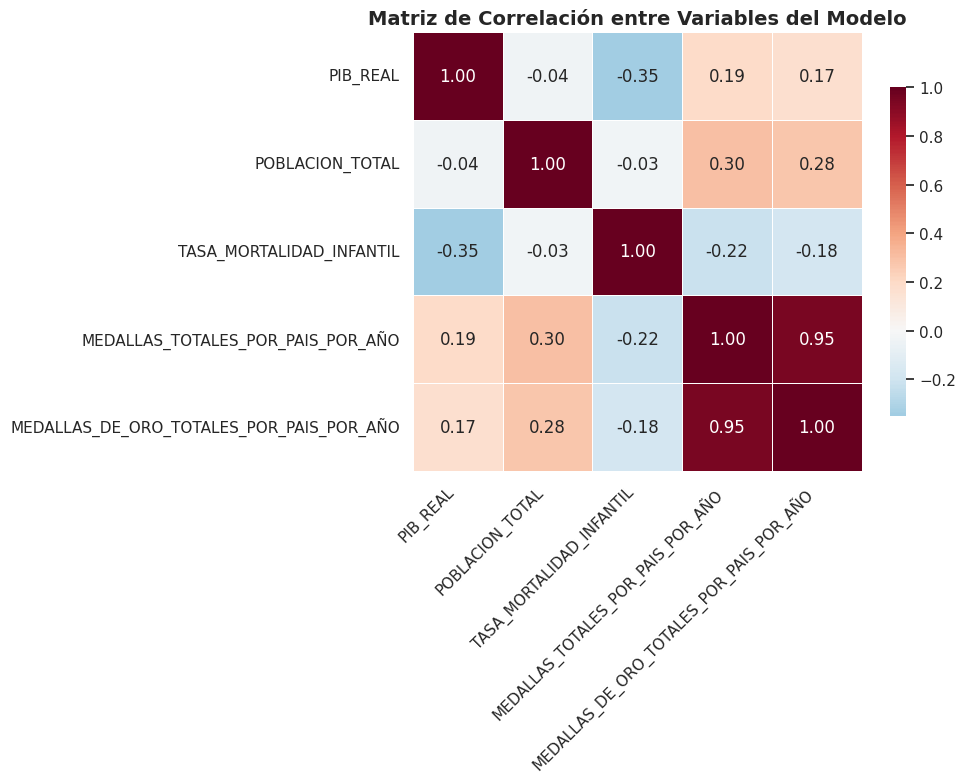

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Variables ordenadas por lógica temática
variables = [
    'PIB_REAL',
    'POBLACION_TOTAL',
    'TASA_MORTALIDAD_INFANTIL',
    'MEDALLAS_TOTALES_POR_PAIS_POR_AÑO',
    'MEDALLAS_DE_ORO_TOTALES_POR_PAIS_POR_AÑO'
]

# Calcular y redondear matriz de correlación
corr = df6[variables].corr().round(2)

# Tamaño y estilo
plt.figure(figsize=(10, 8))
sns.set(style="whitegrid")

# Crear heatmap
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    linewidths=.5,
    cbar_kws={"shrink": 0.75}
)

plt.title("Matriz de Correlación entre Variables del Modelo", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


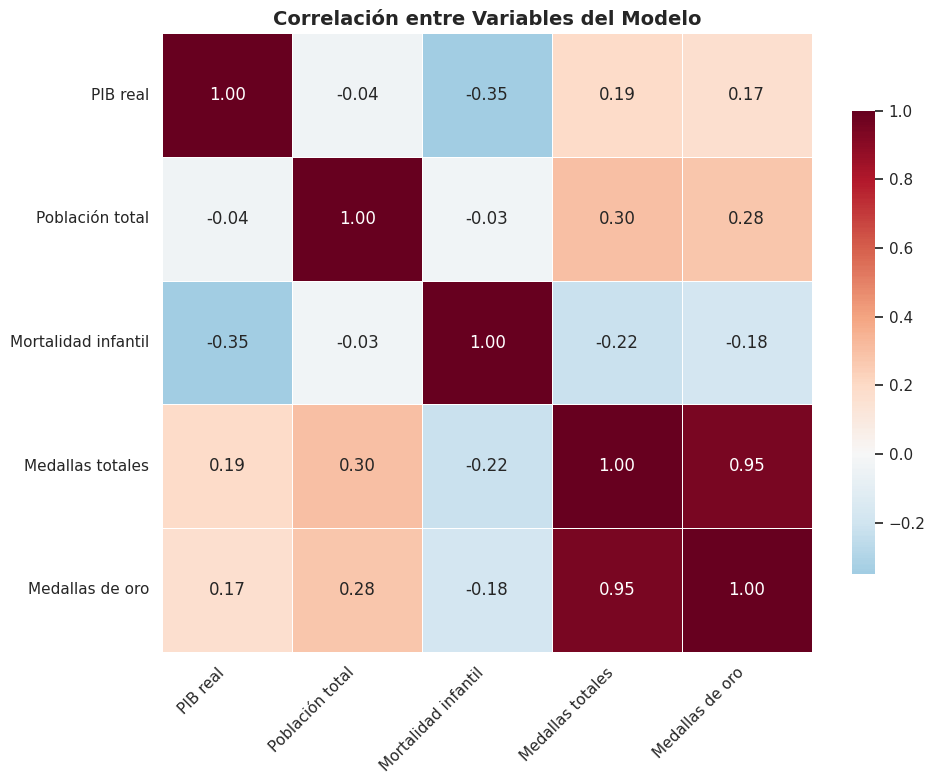

In [ ]:
# Crear un diccionario para renombrar
rename_dict = {
    'PIB_REAL': 'PIB real',
    'POBLACION_TOTAL': 'Población total',
    'TASA_MORTALIDAD_INFANTIL': 'Mortalidad infantil',
    'MEDALLAS_TOTALES_POR_PAIS_POR_AÑO': 'Medallas totales',
    'MEDALLAS_DE_ORO_TOTALES_POR_PAIS_POR_AÑO': 'Medallas de oro'
}

# Aplicar renombres antes de graficar
df_renombrado = df6[rename_dict.keys()].rename(columns=rename_dict)
corr = df_renombrado.corr().round(2)

# Plot mejorado
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    linewidths=.5,
    cbar_kws={"shrink": 0.75}
)

plt.title("Correlación entre Variables del Modelo", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
